# SIFT Image Matching

Fabiano Junior Maia Manschein

3D Vision Computation at Toyohashi University of Tecnology

Imaging and Light in Extended Reality (IMLEX) Master's Program

In [3]:
import cv2

# If using colab:
# from google.colab.patches import cv2_imshow

Here we define the function `image_match`. It takes the paths to 2 images, a detector, and a matcher as inputs, then as output shows the image matches. The language of choice is Python for OpenCV.

In [4]:
def image_match(path_to_img1, path_to_img2, detector, matcher):
  # Load images
  img1 = cv2.imread(path_to_img1)
  img2 = cv2.imread(path_to_img2)

  # Find keypoints and descriptors
  kp1, des1 = detector.detectAndCompute(img1, None)
  kp2, des2 = detector.detectAndCompute(img2, None)

  # Draw keypoints on the images
  img1_kp = cv2.drawKeypoints(img1, kp1, img1)
  img2_kp = cv2.drawKeypoints(img2, kp2, img2)

  # Use KNN matching to find matches
  matches = matcher.knnMatch(des1, des2, k=2)

  # Apply Lowe's ratio test to get good matches
  good_matches = []
  for m, n in matches:
      if m.distance < 0.75 * n.distance:
          good_matches.append(m)

  # Extract matched keypoints
  matched_kp1 = []
  matched_kp2 = []
  for match in good_matches:
      matched_kp1.append(kp1[match.queryIdx])
      matched_kp2.append(kp2[match.trainIdx])

  # Draw matches
  img_matches = cv2.drawMatches(img1, kp1, img2, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

  # Display the result
  cv2.imshow(img_matches)

  # If using colab:
  # cv2_imshow(img_matches)

We start by defining both the detector and the matcher. For this assignment, I picked the SIFT detector, since SURF is patented and not available in OpenCV. For the matcher, I chose a FLANN-based matcher since it's included in OpenCV and easy to use.

In [5]:
# Initialize SIFT detector
sift = cv2.SIFT_create()

# Initialize a FLANN-based matcher
matcher = cv2.FlannBasedMatcher_create()

## 6 Virtual Locations Dataset

The dataset used for testing the image matching is "Image Matching Dataset of 6 virtual locations" from Kaggle: https://www.kaggle.com/datasets/fluxo4/fluxsets

It provides 6 different randomly generated scenarios with random lighting. From each of those, I manually chose 2 pictures, except for Gen6 which was chosen randomly.

Here we start with "Gen1". In this scenario, we already see something that will happen throughout all the scenarios: the random/reflective "blobs" disrupt the matching and make the algorithm commit mistakes. We also notice from Gen1 that most of the matches are in the sky, with only a few correct ones on the building itself (the door).

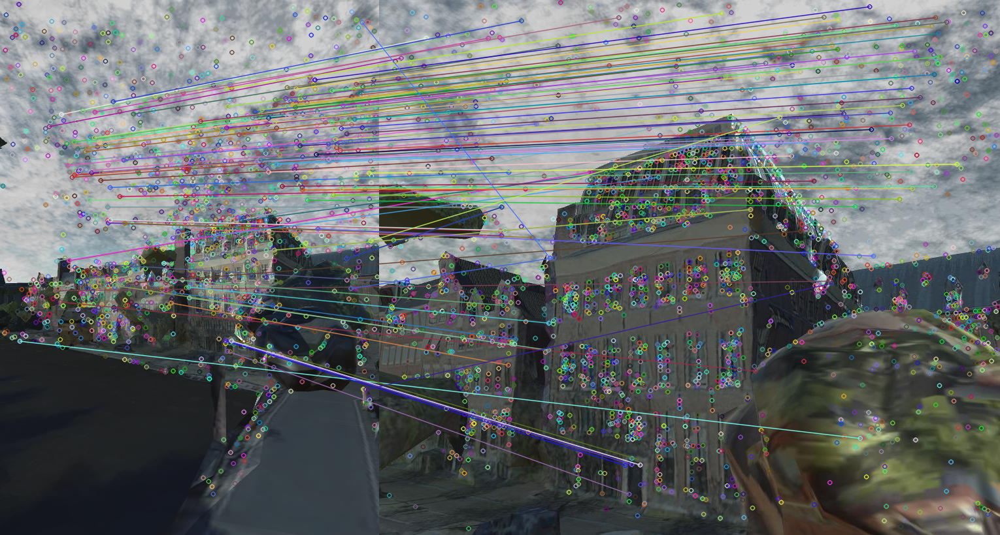

In [ ]:
pti1 = "data/gen1_img1.jpg"
pti2 = "data/gen1_img2.jpg"

image_match(pti1, pti2, sift, matcher)

Gen2. It was a surprise to me how it didn't detect any keypoints on/around the yellow square. As a human, that's the most distinguishing feature that I used to match the two images, but the algorithm ignored it. Instead, it matched the top windows. One of the reasons for this could be the bluriness around the edges of the yellow square, plus lack of lines (it's mostly a flat area), while the windows have plenty of edges for feature extraction.

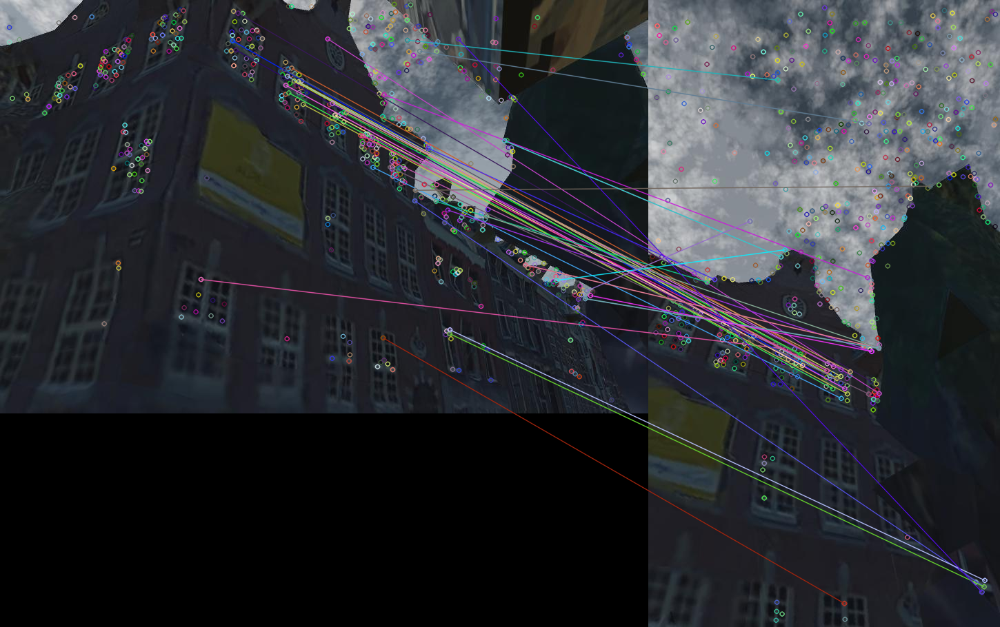

In [ ]:
pti1 = "data/gen2_img1.jpg"
pti2 = "data/gen2_img2.jpg"

image_match(pti1, pti2, sift, matcher)

Gen3 was the most successful test. Here, there were plenty of matches between the two images. This is probably due to the buildings being more clearly defined and filled with edges and lines that can be extracted as features. Although the second images had plenty of random blobs, they caused only a few mistakes.

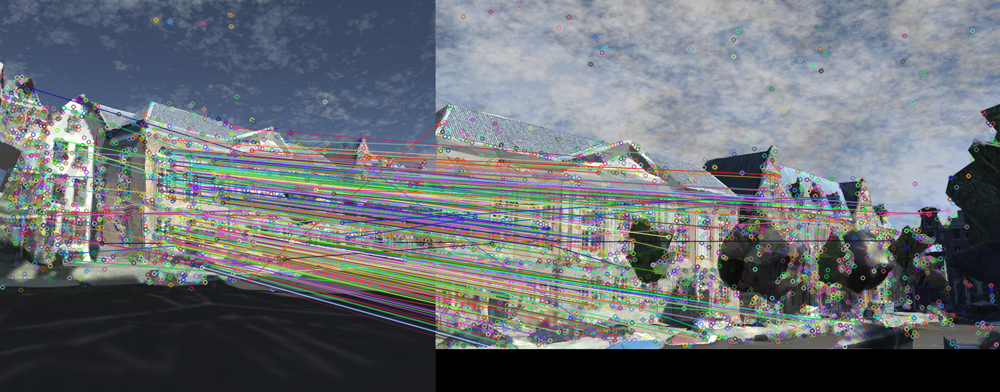

In [ ]:
pti1 = "data/gen3_img1.jpg"
pti2 = "data/gen3_img2.jpg"

image_match(pti1, pti2, sift, matcher)

Gen4 was a challenge. It's two very different angles, and the right image has a shadow on the building, which could make it harder to detect the edges and lines. We can notice that the main building has a lot more features in the left image, while the second one had features dispersed over the random blobs. Matching in this case wasn't very successful, except maybe for a few keypoints in the building's bottom columns.

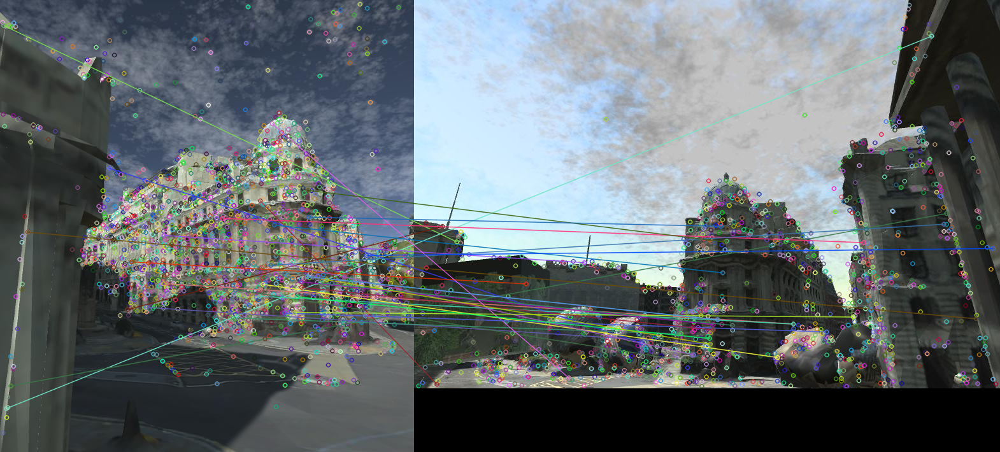

In [ ]:
pti1 = "data/gen4_img1.jpg"
pti2 = "data/gen4_img2.jpg"

image_match(pti1, pti2, sift, matcher)

Gen5 did a good job matching the right building.

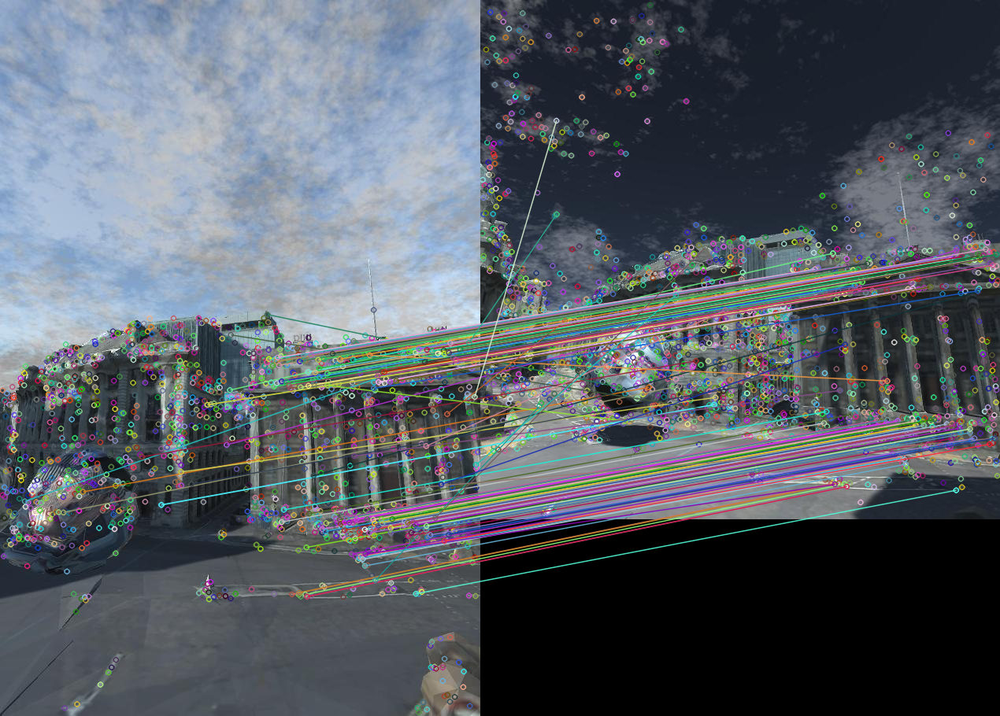

In [ ]:
pti1 = "data/gen5_img1.jpg"
pti2 = "data/gen5_img2.jpg"

image_match(pti1, pti2, sift, matcher)

For Gen6, I picked two random images. Matching was not very successful, but the few matches done were mostly correct.

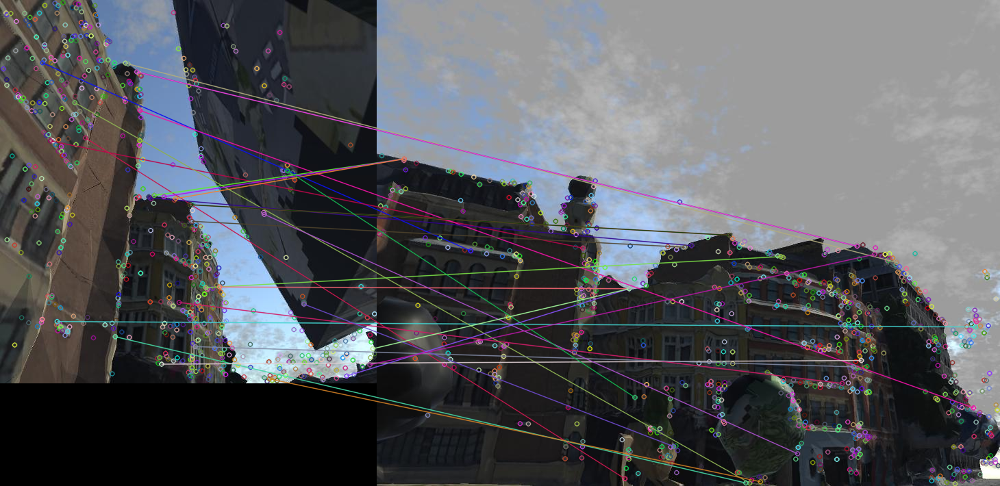

In [ ]:
pti1 = "data/gen6_img1.jpg"
pti2 = "data/gen6_img2.jpg"

image_match(pti1, pti2, sift, matcher)

## My personal pictures dataset

Here, I used pictures that I took during my trips. Note that due to Colab limitations, I reduced the resolution by 75% from 3000+ pixels.

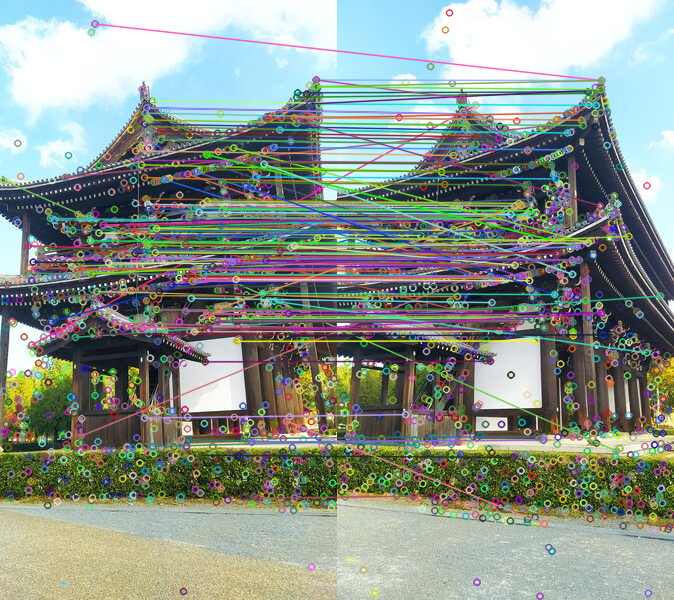

In [ ]:
pti1 = "data/kyoto1_s.jpg"
pti2 = "data/kyoto2_s.jpg"

image_match(pti1, pti2, sift, matcher)

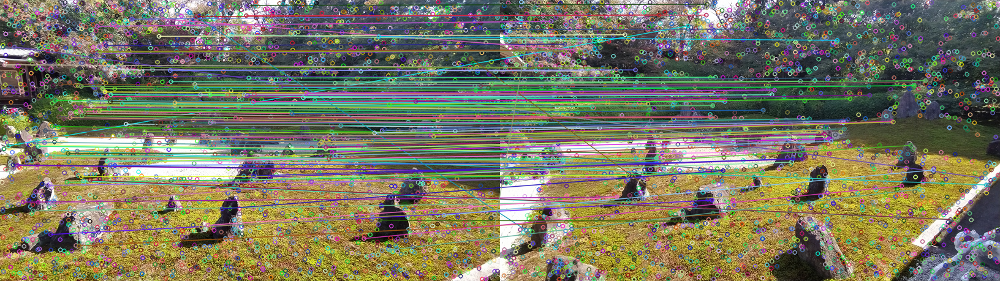

In [ ]:
pti1 = "data/kyoto3.jpg"
pti2 = "data/kyoto4.jpg"

image_match(pti1, pti2, sift, matcher)

We can clearly notice that the rate of success and accuracy on both cases is much higher than any of the randomly generated environments (with Gen3 being a close call). This is likely due to the lack of noise in the images in form of random blobs, random lighting, and overal bluriness and lack of edges due to poor environment generation.